# Calculate Arrival Times

In [46]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from dask.distributed import Client
from xrsignal import xrsignal
from scipy import signal
from NI_tools.NI_tools import inversion
import hvplot.xarray
import holoviews as hv
import scipy

In [15]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.80 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37277,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.80 GiB
Comm: tcp://127.0.0.1:40591,Total threads: 4
Dashboard: http://127.0.0.1:35371/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:33105,


## Remove Outliers

In [62]:
fn = '/datadrive/NCCFs/1hr_20150101_20230101_ec_cc.nc'
NCCFs = xr.open_dataarray(fn).chunk({'delay':11999, 'time':100})
NCCFs = NCCFs.rename({'time':'dates'})

time_coord = pd.to_datetime(np.arange(pd.Timestamp('2015-01-01').value, pd.Timestamp('2023-01-01').value, 1e9*3600))
NCCFs = NCCFs.assign_coords({'dates':time_coord})

In [ ]:
energy = (NCCFs*NCCFs).mean('delay').compute()
energy_norm = (energy)/energy.std()

### Create Figure of Energy Distribution

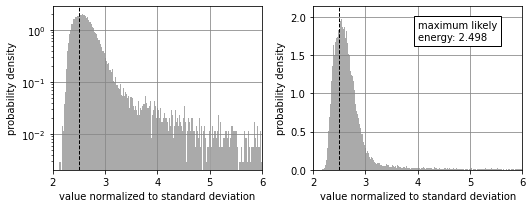

In [78]:
fig = plt.figure(figsize=(7.5,3))
plt.subplot(1,2,1)
ax = plt.gca()
hist = energy_norm.plot.hist(bins=np.linspace(0,6,1000), density=True, yscale='log',color='#AAAAAA')
plt.xlim([2,6])
plt.grid(color='#888888')
plt.ylabel('probability density')
plt.xlabel('value normalized to standard deviation')
ylims = ax.get_ylim()

plt.plot([hist[1][np.argmax(hist[0])], hist[1][np.argmax(hist[0])]], ylims, '--k', linewidth=1)
plt.ylim(ylims)

plt.subplot(1,2,2)
ax = plt.gca()

hist = energy_norm.plot.hist(bins=np.linspace(0,6,1000), density=True, yscale='linear', color='#AAAAAA')
plt.xlim([2,6])
plt.grid(color='#888888')
plt.ylabel('probability density')
plt.xlabel('value normalized to standard deviation')

ylims = ax.get_ylim()
plt.plot([hist[1][np.argmax(hist[0])], hist[1][np.argmax(hist[0])]], ylims, '--k', linewidth=1)
plt.ylim(ylims)
plt.tight_layout()
plt.text(4, 1.7, f'maximum likely\nenergy: {hist[1][np.argmax(hist[0])]:1.3f}',
        bbox=dict(facecolor='white', edgecolor='black'))

fig.savefig('figures/energy_distribution.png', dpi=300)

### Choose energy threshold
- manually inspecting hour long nccf
- considering percentage of data thrown out

In [66]:
threshold = 4
mask = energy_norm <= threshold
nan_mask = np.isnan(NCCFs[:,0])
print(f'percent of data kept: {(mask.sum()/len(mask)*100).values:3.1f} %')

percent of data kept: 81.1 %


#### Plot NCCF and Mask

In [84]:
threshold_plot = (~(nan_mask | mask)).astype(int).hvplot(width=800, height=200, title='', ylabel='')

In [69]:
NCCFs.load()

<xarray.DataArray 'random_sample-ee3db8cfae86a32195d4ba600f7a3975' (
                                                                    dates: 70128,
                                                                    delay: 11999)>
array([[            nan,             nan,             nan, ...,
                    nan,             nan,             nan],
       [            nan,             nan,             nan, ...,
                    nan,             nan,             nan],
       [            nan,             nan,             nan, ...,
                    nan,             nan,             nan],
       ...,
       [-4.76417769e-07,  6.57409898e-07, -1.80941896e-06, ...,
         5.59095659e-07,  1.18694199e-06,  1.14701257e-06],
       [-6.01586616e-07, -1.94254733e-06, -1.86727492e-06, ...,
         1.95981251e-06,  1.48117419e-06,  1.39137043e-06],
       [-3.32265224e-06, -9.13187541e-07, -1.95311091e-06, ...,
        -5.61310661e-06, -1.74990434e-06,  2.72978234e-06]])
Coordinates:
  * delay    (delay) float64 -30.0 -29.99 -29.99 -29.98 ... 29.98 29.99 29.99
  * dates    (dates) datetime64[ns] 2015-01-01 ... 2022-12-31T23:00:00

In [86]:
NCCF_plot = NCCFs.hvplot.image(x='dates', rasterize=True, cmap='inferno', width=800)

In [87]:
(NCCF_plot + threshold_plot).cols(1)

:Layout
   .DynamicMap.I :DynamicMap   []
      :Image   [dates,delay]   (random_sample-ee3db8cfae86a32195d4ba600f7a3975)
   .Curve.I      :Curve   [dates]   (random_sample-ee3db8cfae86a32195d4ba600f7a3975)

## Filter Data

- in order to have multiple averaging times, we need to calculate the elbow plots for 201, 601, and 1001 hours, for each of the 5 peaks (or 15 corner frequencies...)

In [3]:
fn = '/datadrive/NCCFs/1hr_20150101_20230101_ec_cc.nc'
NCCFs = xr.open_dataarray(fn).chunk({'delay':11999, 'time':100})
NCCFs = NCCFs.rename({'time':'dates'})

time_coord = pd.to_datetime(np.arange(pd.Timestamp('2015-01-01').value, pd.Timestamp('2023-01-01').value, 1e9*3600))
NCCFs = NCCFs.assign_coords({'dates':time_coord})

In [29]:
# Compute Threshold and remove from NCCF
energy = (NCCFs*NCCFs).mean('delay').compute()
energy_norm = (energy)/energy.std()

threshold = 4
mask = energy_norm <= threshold
NCCFs[~mask,:] = np.nan

In [46]:
NCCFs201 = NCCFs.rolling(dates=201, min_periods=100).mean()
NCCFs1001 = NCCFs.rolling(dates=1001, min_periods=100).mean()

In [60]:
b,a = signal.butter(4, 0.6, btype='lowpass')
NCCFs_filtered201 = xr.Dataset({'NCCFs':xrsignal.filtfilt(NCCFs201, dim='delay', b=b, a=a)})
NCCFs_filtered1001 = xr.Dataset({'NCCFs':xrsignal.filtfilt(NCCFs1001, dim='delay', b=b, a=a)})

In [61]:
s1b0_at_201 = inversion.calc_prop_times(NCCFs_filtered201, peaks=['s1b0A'], dim='delay')
s1b0_at_1001 = inversion.calc_prop_times(NCCFs_filtered1001, peaks=['s1b0A'], dim='delay').compute()

In [58]:
(-1*s1b0_at_1001['NCCFs']).loc['s1b0A'].hvplot(grid=True)

:Curve   [dates]   (NCCFs)

#### Look at outlier

In [33]:
s1b0_at = s1b0_at['NCCFs'].loc['s1b0A'].compute()

In [45]:
(-1*s1b0_at).hvplot(grid=True)

:Curve   [dates]   (NCCFs)

In [43]:
NCCF_slice = NCCFs_filtered.sel({'dates':slice(pd.Timestamp('2018-06-15'), pd.Timestamp('2018-08-01'))})['NCCFs'].compute()

In [44]:
NCCF_slice.hvplot.image(x='dates', rasterize=True, cmap='inferno')

:DynamicMap   []
   :Image   [dates,delay]   (NCCFs)

## Build scripts to calculate arrivals

- 201, 601, 1001 hours
    each filtered to relevant corner
- with and without outlier removal
- s1b0A, s1b0B

**Quick Idea**
- what if I use 1-5 Hz, estimate the arrival time like every 5 hours, and get a distribution of arrival times that we can then use to estimate the most likely value?

In [3]:
from scipy import signal

In [4]:
fcs = [
    [46.45346687092607, 35.528258201431036],
    [54.724490650555055, 38.998664801096524],
    [60.603626021214424, 40.2010426874647]
]

bs_A = []
as_A = []
bs_B = []
as_B = []

for fc in fcs:
    b,a = signal.butter(4, Wn=[fc[0]/100], btype='lowpass')
    bs_A.append(b)
    as_A.append(a)
    b,a = signal.butter(4, Wn=[fc[1]/100], btype='lowpass')
    bs_B.append(b)
    as_B.append(a)

In [5]:
filtered_NCCFs_A = []
filtered_NCCFs_B = []

avg_hours = [201, 601, 1001]

for k in range(len(bs_A)):
    filtered_NCCFs_A.append(xrsignal.filtfilt(NCCFs, dim='delay', b=bs_A[k], a=as_A[k]))
    filtered_NCCFs_A[-1].attrs = {'fc':fcs[k][0], 'avg_hours':avg_hours[k]}
    filtered_NCCFs_B.append(xrsignal.filtfilt(NCCFs, dim='delay', b=bs_B[k], a=as_B[k]))
    filtered_NCCFs_B[-1].attrs = {'fc':fcs[k][1], 'avg_hours':avg_hours[k]}

In [12]:
ats = []
for k in range(3):
    at = inversion.calc_prop_times(xr.Dataset({'NCCFs':filtered_NCCFs_A[k]}), peaks=['s1b0A'])['NCCFs'].loc['s1b0A',:]
    ats.append(at)
    
    at = inversion.calc_prop_times(xr.Dataset({'NCCFs':filtered_NCCFs_B[k]}), peaks=['s1b0B'])['NCCFs'].loc['s1b0B',:]
    ats.append(at)

In [38]:
ats_x = xr.concat(ats, dim='avg_hour').assign_coords({'avg_hour':[201, 201, 601, 601, 1001, 1001]})

In [ ]:
fn = '/datadrive/NCCFs/arrival_times/

## Look at arrival times

In [16]:
fn1 = '/datadrive/NCCFs/arrival_times/no_outlier_removal.nc'
fn2 = '/datadrive/NCCFs/arrival_times/outlier_removal_threshold_3.nc'
fn3 = '/datadrive/NCCFs/arrival_times/outlier_removal_threshold_4.nc'
fn4 = '/datadrive/NCCFs/arrival_times/outlier_removal_threshold_5.nc'

da_no = xr.open_dataarray(fn1)
da_o3 = xr.open_dataarray(fn2)
da_o4 = xr.open_dataarray(fn3)
da_o5 = xr.open_dataarray(fn4)

In [31]:
idx = 4
arrival_time_plot = (da_no[idx].hvplot(label='no outliers') * da_o3[idx].hvplot(label='3') * da_o4[idx].hvplot(label='4') * da_o5[idx].hvplot(label='5'))

In [32]:
arrival_time_plot

:Overlay
   .Curve.No_outliers :Curve   [dates]   (NCCFs)
   .Curve.A_3         :Curve   [dates]   (NCCFs)
   .Curve.A_4         :Curve   [dates]   (NCCFs)
   .Curve.A_5         :Curve   [dates]   (NCCFs)

In [50]:
at_nonan = da_o3[0].interpolate_na(dim='dates').loc[pd.Timestamp('2015-01-20'):]
at_nonan_nm = at_nonan - at_nonan.mean()

In [52]:
at_f = scipy.fft.fft(at_nonan_nm.values)

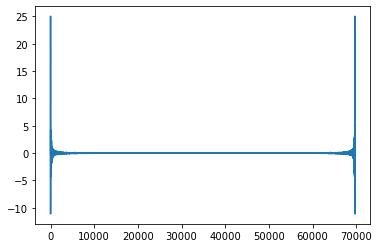

In [54]:
plt.plot(at_f)

In [55]:
f = np.linspace(0,1,len(at_f))

In [66]:
T = 365.25*24

In [79]:
idx = np.argmin(np.abs(f-(1/T)))

In [89]:
annualf = np.zeros(len(f)).astype(complex)
annualf[idx]=at_f[idx]
annualf[len(f)-idx] = at_f[len(f)-idx]

annualt = np.real(scipy.fft.ifft(annualf))

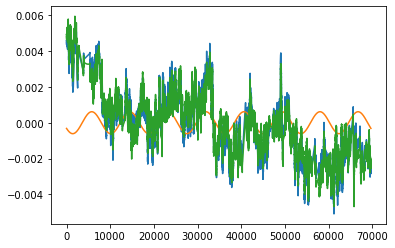

In [94]:
plt.plot(at_nonan_nm)
plt.plot(annualt)
plt.plot(at_nonan_nm - annualt)